In [31]:
import os
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import Counter

# Image processing
from PIL import Image

# Sklearn utilities
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# TensorFlow & Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import MobileNetV2, EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [32]:
# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

In [33]:
# Configure matplotlib
plt.style.use('default')
sns.set_palette("husl")

In [34]:
DATASET_PATH = 'dataset'

In [35]:
# Output paths
SPLIT_DATASET_PATH = 'dataset_split'
MODEL_SAVE_PATH = 'models'
RESULTS_PATH = 'results'

In [36]:
# Create directories
Path(MODEL_SAVE_PATH).mkdir(exist_ok=True)
Path(RESULTS_PATH).mkdir(exist_ok=True)

In [37]:
# Hyperparameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 30
LEARNING_RATE = 0.001

In [38]:
# Split ratios
TRAIN_RATIO = 0.7
VAL_RATIO = 0.15
TEST_RATIO = 0.15

In [39]:
print("="*70)
print("CONFIGURATION")
print("="*70)
print(f"Dataset path: {DATASET_PATH}")
print(f"Image size: {IMG_SIZE}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Epochs: {EPOCHS}")
print(f"Learning rate: {LEARNING_RATE}")
print(f"Split ratio: Train={TRAIN_RATIO}, Val={VAL_RATIO}, Test={TEST_RATIO}")
print("="*70)

CONFIGURATION
Dataset path: dataset
Image size: (224, 224)
Batch size: 32
Epochs: 30
Learning rate: 0.001
Split ratio: Train=0.7, Val=0.15, Test=0.15


In [40]:
# ============================================
# DATASET HEALTH CHECK
# ============================================

def check_dataset_health(dataset_path):
    """Comprehensive health check for dataset"""
    
    print("\n" + "="*70)
    print("DATASET HEALTH CHECK")
    print("="*70)
    
    results = {}
    
    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        
        if not os.path.isdir(class_path):
            continue
        
        print(f"\n📁 {class_name.upper()}:")
        print("-" * 70)
        
        files = [f for f in os.listdir(class_path) 
                if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        
        corrupt_files = []
        valid_sizes = []
        extensions = []
        
        for file in files:
            filepath = os.path.join(class_path, file)
            ext = os.path.splitext(file)[1].lower()
            extensions.append(ext)
            
            try:
                img = Image.open(filepath)
                img.verify()
                img.close()
                
                img = Image.open(filepath)
                valid_sizes.append((img.width, img.height))
                img.close()
                
            except Exception as e:
                corrupt_files.append(file)
        
        # Statistics
        print(f"   Total files: {len(files)}")
        print(f"   Valid files: {len(files) - len(corrupt_files)}")
        print(f"   Corrupt files: {len(corrupt_files)}")
        
        if corrupt_files:
            print(f"   ⚠️  Corrupt files found:")
            for cf in corrupt_files[:5]:
                print(f"      - {cf}")
            if len(corrupt_files) > 5:
                print(f"      ... and {len(corrupt_files) - 5} more")
        
        # File types
        ext_count = Counter(extensions)
        print(f"   File types:")
        for ext, count in ext_count.items():
            print(f"      {ext}: {count}")
        
        # Size statistics
        if valid_sizes:
            widths = [s[0] for s in valid_sizes]
            heights = [s[1] for s in valid_sizes]
            
            print(f"   Dimensions:")
            print(f"      Width:  {min(widths)}px - {max(widths)}px (avg: {sum(widths)//len(widths)}px)")
            print(f"      Height: {min(heights)}px - {max(heights)}px (avg: {sum(heights)//len(heights)}px)")
            
            small_imgs = [s for s in valid_sizes if s[0] < 200 or s[1] < 200]
            if small_imgs:
                print(f"   ⚠️  {len(small_imgs)} images are small (<200px)")
        
        results[class_name] = {
            'total': len(files),
            'valid': len(files) - len(corrupt_files),
            'corrupt': corrupt_files
        }
    
    print("\n" + "="*70)
    print("HEALTH CHECK COMPLETE")
    print("="*70)
    
    return results

# Run health check
health_results = check_dataset_health(DATASET_PATH)


DATASET HEALTH CHECK

📁 .IPYNB_CHECKPOINTS:
----------------------------------------------------------------------
   Total files: 0
   Valid files: 0
   Corrupt files: 0
   File types:

📁 GADANG:
----------------------------------------------------------------------
   Total files: 740
   Valid files: 740
   Corrupt files: 0
   File types:
      .jpg: 740
   Dimensions:
      Width:  50px - 1080px (avg: 255px)
      Height: 50px - 1920px (avg: 201px)
   ⚠️  576 images are small (<200px)

📁 JOGLO:
----------------------------------------------------------------------
   Total files: 735
   Valid files: 735
   Corrupt files: 0
   File types:
      .jpeg: 106
      .jpg: 64
      .png: 565
   Dimensions:
      Width:  100px - 994px (avg: 409px)
      Height: 90px - 1600px (avg: 375px)
   ⚠️  276 images are small (<200px)

HEALTH CHECK COMPLETE


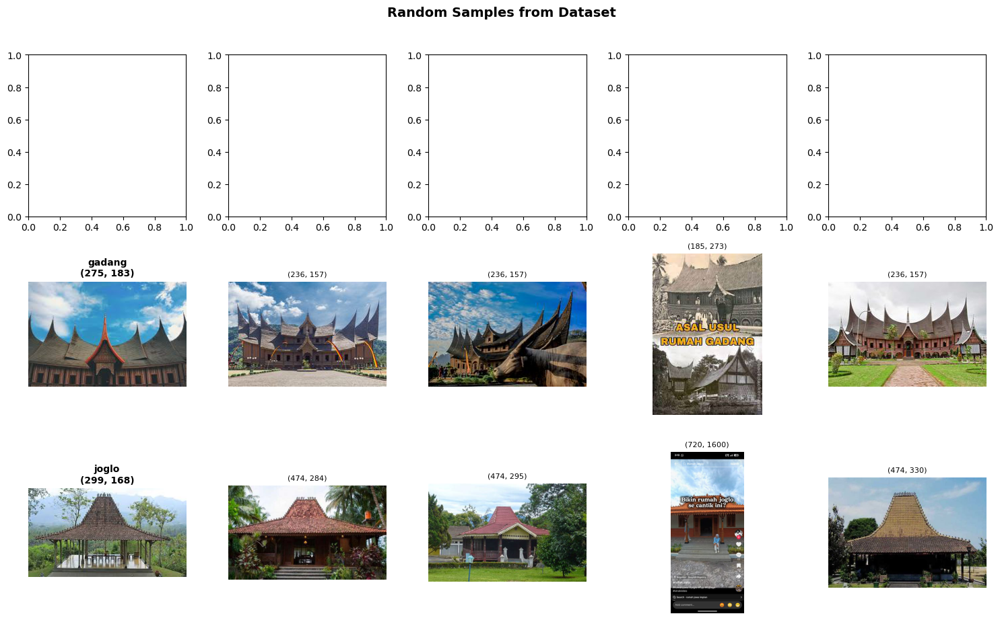

In [41]:
# ============================================
# VISUALIZE SAMPLE IMAGES
# ============================================

def visualize_samples(dataset_path, samples_per_class=5):
    """Display random samples from each class"""
    
    classes = [d for d in os.listdir(dataset_path) 
               if os.path.isdir(os.path.join(dataset_path, d))]
    
    fig, axes = plt.subplots(len(classes), samples_per_class, 
                             figsize=(15, 3*len(classes)))
    
    if len(classes) == 1:
        axes = [axes]
    
    for class_idx, class_name in enumerate(classes):
        class_path = os.path.join(dataset_path, class_name)
        
        files = [f for f in os.listdir(class_path) 
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        samples = random.sample(files, min(samples_per_class, len(files)))
        
        for img_idx, img_file in enumerate(samples):
            img_path = os.path.join(class_path, img_file)
            img = Image.open(img_path)
            
            ax = axes[class_idx][img_idx] if len(classes) > 1 else axes[img_idx]
            ax.imshow(img)
            ax.axis('off')
            
            if img_idx == 0:
                ax.set_title(f'{class_name}\n{img.size}', 
                           fontsize=10, fontweight='bold')
            else:
                ax.set_title(f'{img.size}', fontsize=8)
    
    plt.suptitle('Random Samples from Dataset', fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_PATH, 'dataset_samples.png'), 
                dpi=150, bbox_inches='tight')
    plt.show()

# Visualize samples
visualize_samples(DATASET_PATH, samples_per_class=5)

In [42]:
# ============================================
# SPLIT DATASET (TRAIN/VAL/TEST)
# ============================================

def split_dataset(source_dir, output_dir, split_ratio=(0.7, 0.15, 0.15), seed=42):
    """Split dataset into train/validation/test with stratification"""
    
    print("\n" + "="*70)
    print("SPLITTING DATASET")
    print("="*70)
    
    random.seed(seed)
    
    # Remove existing split directory if exists
    if os.path.exists(output_dir):
        print(f"⚠️  Removing existing split directory: {output_dir}")
        shutil.rmtree(output_dir)
    
    # Get all files with labels
    all_files = []
    all_labels = []
    
    for class_name in os.listdir(source_dir):
        class_path = os.path.join(source_dir, class_name)
        
        if not os.path.isdir(class_path):
            continue
        
        files = [f for f in os.listdir(class_path) 
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        for file in files:
            all_files.append(os.path.join(class_path, file))
            all_labels.append(class_name)
    
    print(f"\nTotal images: {len(all_files)}")
    print(f"Classes: {set(all_labels)}")
    
    for label in set(all_labels):
        count = all_labels.count(label)
        print(f"  {label}: {count} images ({count/len(all_files)*100:.1f}%)")
    
    # Split: train vs (val+test)
    train_files, temp_files, train_labels, temp_labels = train_test_split(
        all_files, all_labels,
        test_size=(1 - split_ratio[0]),
        stratify=all_labels,
        random_state=seed
    )
    
    # Split: val vs test
    val_ratio = split_ratio[1] / (split_ratio[1] + split_ratio[2])
    val_files, test_files, val_labels, test_labels = train_test_split(
        temp_files, temp_labels,
        test_size=(1 - val_ratio),
        stratify=temp_labels,
        random_state=seed
    )
    
    # Copy files to new structure
    def copy_files(files, labels, split_name):
        for file_path, label in zip(files, labels):
            dest_dir = os.path.join(output_dir, split_name, label)
            Path(dest_dir).mkdir(parents=True, exist_ok=True)
            
            filename = os.path.basename(file_path)
            dest_path = os.path.join(dest_dir, filename)
            shutil.copy2(file_path, dest_path)
    
    print("\nCopying files...")
    copy_files(train_files, train_labels, 'train')
    print("  ✓ Train set copied")
    copy_files(val_files, val_labels, 'validation')
    print("  ✓ Validation set copied")
    copy_files(test_files, test_labels, 'test')
    print("  ✓ Test set copied")
    
    # Summary
    print("\n" + "="*70)
    print("SPLIT COMPLETE")
    print("="*70)
    
    def print_split_info(files, labels, split_name):
        print(f"\n{split_name.upper()}:")
        print(f"  Total: {len(files)} images")
        for label in sorted(set(labels)):
            count = labels.count(label)
            print(f"  {label}: {count} ({count/len(files)*100:.1f}%)")
    
    print_split_info(train_files, train_labels, 'train')
    print_split_info(val_files, val_labels, 'validation')
    print_split_info(test_files, test_labels, 'test')
    
    print(f"\n✓ Dataset saved to: {output_dir}")
    print("="*70)
    
    return output_dir

# Split dataset
SPLIT_DATASET_PATH = split_dataset(
    source_dir=DATASET_PATH,
    output_dir=SPLIT_DATASET_PATH,
    split_ratio=(TRAIN_RATIO, VAL_RATIO, TEST_RATIO),
    seed=42
)


SPLITTING DATASET
⚠️  Removing existing split directory: dataset_split

Total images: 1475
Classes: {'gadang', 'joglo'}
  gadang: 740 images (50.2%)
  joglo: 735 images (49.8%)

Copying files...
  ✓ Train set copied
  ✓ Validation set copied
  ✓ Test set copied

SPLIT COMPLETE

TRAIN:
  Total: 1032 images
  gadang: 518 (50.2%)
  joglo: 514 (49.8%)

VALIDATION:
  Total: 221 images
  gadang: 111 (50.2%)
  joglo: 110 (49.8%)

TEST:
  Total: 222 images
  gadang: 111 (50.0%)
  joglo: 111 (50.0%)

✓ Dataset saved to: dataset_split


In [43]:
# ============================================
# CALCULATE CLASS WEIGHTS
# ============================================

def calculate_class_weights(train_dir):
    """Calculate class weights for imbalanced dataset"""
    
    print("\n" + "="*70)
    print("CALCULATING CLASS WEIGHTS")
    print("="*70)
    
    class_counts = {}
    
    for class_name in os.listdir(train_dir):
        class_path = os.path.join(train_dir, class_name)
        if os.path.isdir(class_path):
            count = len([f for f in os.listdir(class_path) 
                        if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
            class_counts[class_name] = count
    
    print("\nClass distribution:")
    total = sum(class_counts.values())
    for class_name, count in sorted(class_counts.items()):
        print(f"  {class_name}: {count} ({count/total*100:.1f}%)")
    
    # Calculate imbalance ratio
    counts = list(class_counts.values())
    imbalance_ratio = max(counts) / min(counts)
    print(f"\nImbalance ratio: {imbalance_ratio:.2f}:1")
    
    if imbalance_ratio > 1.5:
        print("⚠️  Moderate imbalance detected - using class weights")
    elif imbalance_ratio > 1.1:
        print("ℹ️  Slight imbalance detected - using class weights as precaution")
    else:
        print("✓ Dataset is balanced")
    
    # Compute class weights
    classes = sorted(class_counts.keys())
    y_train = []
    for idx, class_name in enumerate(classes):
        y_train.extend([idx] * class_counts[class_name])
    
    y_train = np.array(y_train)
    
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(y_train),
        y=y_train
    )
    
    class_weight_dict = {idx: weight for idx, weight in enumerate(class_weights)}
    
    print("\nClass weights:")
    for idx, class_name in enumerate(classes):
        print(f"  {class_name} (class {idx}): {class_weight_dict[idx]:.4f}")
    
    print("\n💡 Higher weight = more emphasis during training")
    print("="*70)
    
    return class_weight_dict, classes

# Calculate class weights
CLASS_WEIGHTS, CLASS_NAMES = calculate_class_weights(
    os.path.join(SPLIT_DATASET_PATH, 'train')
)


CALCULATING CLASS WEIGHTS

Class distribution:
  gadang: 518 (50.2%)
  joglo: 514 (49.8%)

Imbalance ratio: 1.01:1
✓ Dataset is balanced

Class weights:
  gadang (class 0): 0.9961
  joglo (class 1): 1.0039

💡 Higher weight = more emphasis during training


In [58]:
from tensorflow.keras import Input
# 1. Data Loading (Bersih)
# Hanya rescale agar model bisa belajar (numerik stabil), tapi tanpa augmentasi
baseline_datagen = ImageDataGenerator(rescale=1./255)

train_gen_baseline = baseline_datagen.flow_from_directory(
    'dataset_split/train',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

val_gen_baseline = baseline_datagen.flow_from_directory(
    'dataset_split/validation',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# 2. Model Arsitektur (Simple CNN)
model_baseline = Sequential([
    Input(shape=(224, 224, 3)),
    Conv2D(32, 3, activation='relu'),
    MaxPooling2D(),
    Conv2D(64, 3, activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(2, activation='softmax') # Assuming 2 classes based on snippets (gadang, joglo)
])

Found 1032 images belonging to 2 classes.
Found 221 images belonging to 2 classes.


In [61]:
# ============================================
# 2. BUILD BASELINE CNN MODEL
# ============================================
def create_baseline_model(input_shape, num_classes):
    model = Sequential([
        # Input Layer sekarang didefinisikan dengan benar
        Input(shape=(input_shape[0], input_shape[1], 3)),
        
        # Block 1
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        
        # Block 2
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        
        # Block 3
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        
        # Classifier
        Flatten(),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    return model

print("\nBUILDING BASELINE MODEL")
model_baseline = create_baseline_model(IMG_SIZE, len(CLASS_NAMES))

model_baseline.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model_baseline.summary()

# ============================================
# 3. TRAIN BASELINE MODEL
# ============================================
print("\nTRAINING BASELINE MODEL")
history_baseline = model_baseline.fit(
    train_gen_baseline,
    epochs=15,
    validation_data=val_gen_baseline,
    verbose=1
)


BUILDING BASELINE MODEL


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_17 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_17 (MaxPooling2D)      │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_18 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 128)                 │      12,845,184 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,938,690 (49.36 MB)

 Trainable params: 12,938,690 (49.36 MB)

 Non-trainable params: 0 (0.00 B)


TRAINING BASELINE MODEL
Epoch 1/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 27s 786ms/step - accuracy: 0.5940 - loss: 0.8259 - val_accuracy: 0.7421 - val_loss: 0.4899
Epoch 2/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 18s 548ms/step - accuracy: 0.8023 - loss: 0.4599 - val_accuracy: 0.7240 - val_loss: 0.5140
Epoch 3/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 18s 556ms/step - accuracy: 0.8643 - loss: 0.3232 - val_accuracy: 0.9095 - val_loss: 0.2725
Epoch 4/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 19s 567ms/step - accuracy: 0.9448 - loss: 0.1758 - val_accuracy: 0.9367 - val_loss: 0.2072
Epoch 5/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 19s 585ms/step - accuracy: 0.9758 - loss: 0.0827 - val_accuracy: 0.9321 - val_loss: 0.1884
Epoch 6/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 18s 557ms/step - accuracy: 0.9864 - loss: 0.0416 - val_accuracy: 0.9321 - val_loss: 0.1942
Epoch 7/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 19s 559ms/step - accuracy: 0.9981 - loss: 0.0181 - val_accuracy: 0.9502 - val_loss: 0.2242
Epoch 8/15
33/33 ━━━━━━━━━━━━━━━━━━━━ 18s 554ms/step - accuracy: 1.0000 

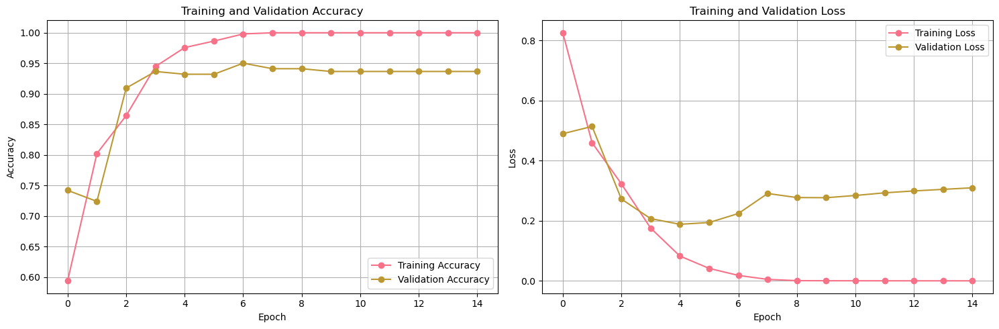

In [62]:
def plot_history(history):
    # Mengambil nilai akurasi dan loss dari history
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs_range = range(len(acc))

    plt.figure(figsize=(15, 5))

    # 1. Grafik Akurasi
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy', marker='o')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy', marker='o')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.grid(True)

    # 2. Grafik Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss', marker='o')
    plt.plot(epochs_range, val_loss, label='Validation Loss', marker='o')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_history(history_baseline)

Found 222 images belonging to 2 classes.
Generating predictions...


C:\Users\ASUS\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step


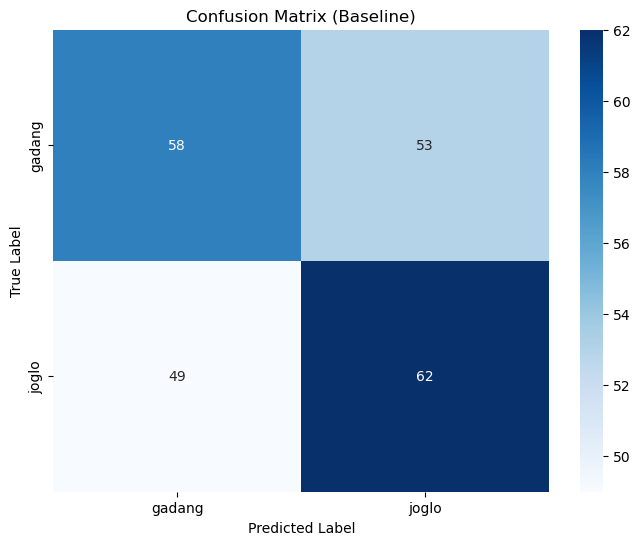


Classification Report (Baseline):
              precision    recall  f1-score   support

      gadang       0.54      0.52      0.53       111
       joglo       0.54      0.56      0.55       111

    accuracy                           0.54       222
   macro avg       0.54      0.54      0.54       222
weighted avg       0.54      0.54      0.54       222



In [84]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import numpy as np
test_gen_baseline = baseline_datagen.flow_from_directory(
    'dataset_split/test',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)
# Pastikan shuffle=False agar urutan prediksi cocok dengan label asli
print("Generating predictions...")
val_gen_baseline.reset() # Reset generator
Y_pred = model_baseline.predict(test_gen_baseline)
y_pred = np.argmax(Y_pred, axis=1)

# Ambil label asli
y_true = test_gen_baseline.classes

# 1. Tampilkan Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=CLASS_NAMES, 
            yticklabels=CLASS_NAMES)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Baseline)')
plt.show()

# 2. Tampilkan Laporan Klasifikasi (Precision, Recall, F1-Score)
print("\nClassification Report (Baseline):")
print(classification_report(y_true, y_pred, target_names=CLASS_NAMES))

In [65]:
# ============================================
# 1. SETUP DATA GENERATORS (WITH AUGMENTATION)
# ============================================
print("\n" + "="*70)
print("SETUP DATA GENERATORS (WITH AUGMENTATION)")
print("="*70)

# Tambahkan variasi gambar (Augmentasi)
# Ini memaksa model belajar fitur objek, bukan menghafal posisi pixel
train_datagen_aug = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,      # Rotasi acak hingga 20 derajat
    width_shift_range=0.2,  # Geser horizontal
    height_shift_range=0.2, # Geser vertikal
    shear_range=0.2,        # Miringkan gambar
    zoom_range=0.2,         # Zoom in/out
    horizontal_flip=True,   # Balik horizontal
    fill_mode='nearest'     # Isi pixel kosong dengan warna terdekat
)

# Validation tetap HARUS polos (hanya rescale) untuk evaluasi yang jujur
val_datagen = ImageDataGenerator(rescale=1./255)

# Load Data
train_generator_aug = train_datagen_aug.flow_from_directory(
    os.path.join(SPLIT_DATASET_PATH, 'train'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    os.path.join(SPLIT_DATASET_PATH, 'validation'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# ============================================
# 2. BUILD CNN MODEL (FROM SCRATCH + DROPOUT)
# ============================================
# Kita gunakan arsitektur yang mirip dengan baseline, 
# tapi bisa ditambahkan Dropout untuk membantu Augmentasi melawan overfitting.

def create_aug_model(input_shape, num_classes):
    model = Sequential([
        Input(shape=(input_shape[0], input_shape[1], 3)),
        
        # Conv Block 1
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        
        # Conv Block 2
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        
        # Conv Block 3
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        
        # Conv Block 4 (Opsional: Tambah layer agar lebih dalam sedikit)
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        
        Flatten(),
        
        # Dense Layer dengan Dropout
        Dense(512, activation='relu'),
        Dropout(0.5), # Matikan 50% neuron secara acak saat training
        
        Dense(num_classes, activation='softmax')
    ])
    return model

print("\n" + "="*70)
print("BUILDING CUSTOM CNN MODEL (WITH AUGMENTATION)")
print("="*70)

model_aug = create_aug_model(IMG_SIZE, len(CLASS_NAMES))

model_aug.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model_aug.summary()

# ============================================
# 3. TRAIN MODEL (BUTUH EPOCH LEBIH BANYAK)
# ============================================
# Karena data sekarang "bergerak-gerak" (augmentasi), model butuh waktu lebih lama 
# untuk belajar pola yang stabil. Kita naikkan epoch-nya.

print("\n" + "="*70)
print("TRAINING MODEL...")
print("="*70)

history_aug = model_aug.fit(
    train_generator_aug,
    epochs=25, # Naikkan epoch dari 15 ke 25 atau 30
    validation_data=val_generator,
    verbose=1
)


SETUP DATA GENERATORS (WITH AUGMENTATION)
Found 1032 images belonging to 2 classes.
Found 221 images belonging to 2 classes.

BUILDING CUSTOM CNN MODEL (WITH AUGMENTATION)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_20 (MaxPooling2D)      │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_21 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_22 (MaxPooling2D)      │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_23 (Conv2D)                   │ (None, 28, 28, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_23 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 512)                 │      12,845,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 2)                   │           1,026 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,087,426 (49.92 MB)

 Trainable params: 13,087,426 (49.92 MB)

 Non-trainable params: 0 (0.00 B)


TRAINING MODEL...


C:\Users\ASUS\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 28s 798ms/step - accuracy: 0.5300 - loss: 0.7279 - val_accuracy: 0.4977 - val_loss: 0.6891
Epoch 2/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 26s 810ms/step - accuracy: 0.6502 - loss: 0.6504 - val_accuracy: 0.7964 - val_loss: 0.5455
Epoch 3/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 26s 787ms/step - accuracy: 0.6764 - loss: 0.6263 - val_accuracy: 0.7828 - val_loss: 0.5485
Epoch 4/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 27s 810ms/step - accuracy: 0.7093 - loss: 0.5852 - val_accuracy: 0.8462 - val_loss: 0.4548
Epoch 5/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 26s 769ms/step - accuracy: 0.7461 - loss: 0.5323 - val_accuracy: 0.8190 - val_loss: 0.4098
Epoch 6/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 752ms/step - accuracy: 0.7829 - loss: 0.4704 - val_accuracy: 0.8190 - val_loss: 0.3910
Epoch 7/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 754ms/step - accuracy: 0.8188 - loss: 0.4223 - val_accuracy: 0.8552 - val_loss: 0.3196
Epoch 8/25
33/33 ━━━━━━━━━━━━━━━━━━━━ 25s 759ms/step - accuracy: 0.8130 - loss: 0.4090 - val_accu

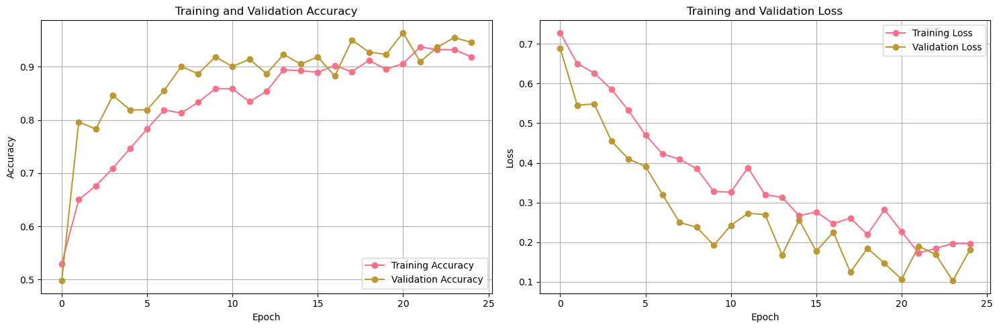

In [66]:
# Plot hasil model augmentasi
plot_history(history_aug)

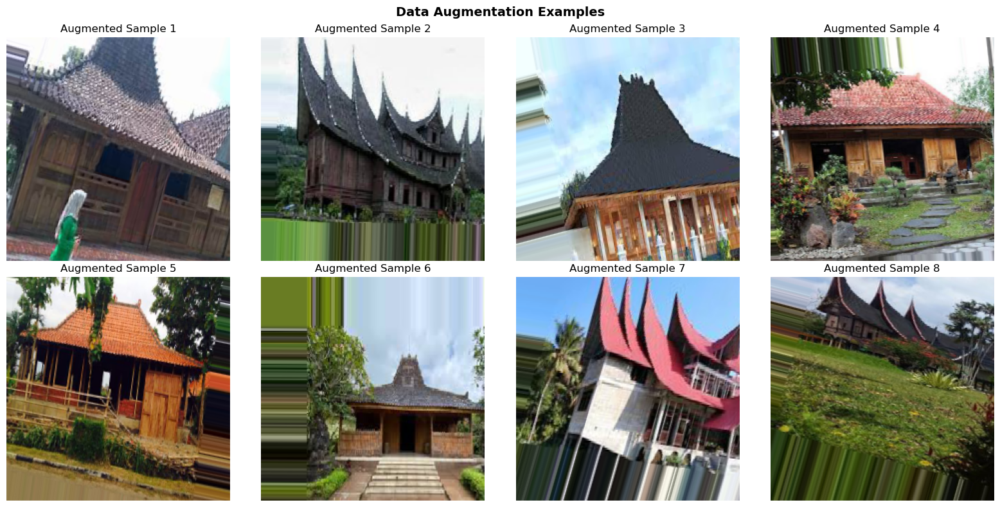

In [69]:
def visualize_augmentation(generator, n_images=8):
    """Show augmented training images"""
    
    batch = next(generator)
    images = batch[0][:n_images]
    
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()
    
    for idx, img in enumerate(images):
        axes[idx].imshow(img)
        axes[idx].axis('off')
        axes[idx].set_title(f'Augmented Sample {idx+1}')
    
    plt.suptitle('Data Augmentation Examples', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_PATH, 'augmentation_examples.png'), 
                dpi=150, bbox_inches='tight')
    plt.show()
    
visualize_augmentation(train_generator_aug, n_images=8)

Found 222 images belonging to 2 classes.
Sedang melakukan prediksi pada data validasi (Model Augmentasi)...


C:\Users\ASUS\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step


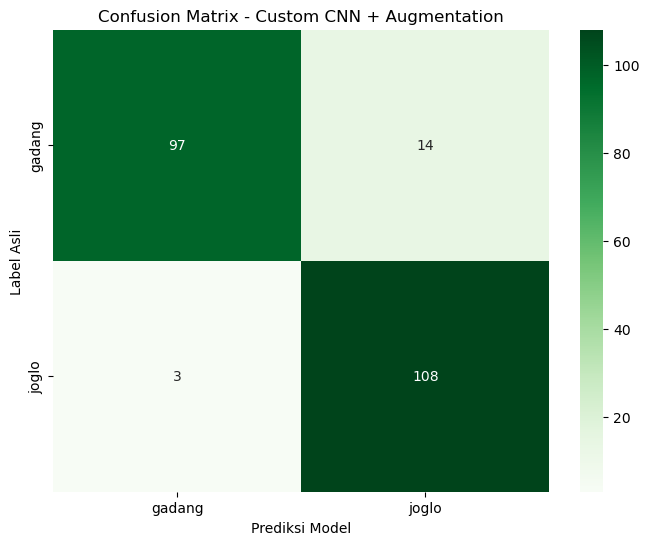


Laporan Klasifikasi (Custom CNN + Augmentation):
              precision    recall  f1-score   support

      gadang       0.97      0.87      0.92       111
       joglo       0.89      0.97      0.93       111

    accuracy                           0.92       222
   macro avg       0.93      0.92      0.92       222
weighted avg       0.93      0.92      0.92       222



In [85]:
test_generator = val_datagen.flow_from_directory(
    os.path.join(SPLIT_DATASET_PATH, 'test'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)
# ============================================
# EVALUASI MODEL AUGMENTASI (Confusion Matrix)
# ============================================

print("Sedang melakukan prediksi pada data validasi (Model Augmentasi)...")

# 1. Reset generator dan lakukan prediksi
# Kita menggunakan 'val_generator' yang didefinisikan di langkah sebelumnya
test_generator.reset() 
Y_pred_aug = model_aug.predict(test_generator)
y_pred_aug = np.argmax(Y_pred_aug, axis=1)

# 2. Ambil label asli
y_true = test_generator.classes
# Pastikan urutan nama kelas sesuai
class_names = list(test_generator.class_indices.keys())

# 3. Buat Confusion Matrix
cm_aug = confusion_matrix(y_true, y_pred_aug)

# 4. Visualisasi Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm_aug, annot=True, fmt='d', cmap='Greens', # Menggunakan warna hijau pembeda
            xticklabels=class_names,
            yticklabels=class_names)
plt.xlabel('Prediksi Model')
plt.ylabel('Label Asli')
plt.title('Confusion Matrix - Custom CNN + Augmentation')
plt.show()

# 5. Tampilkan Laporan Statistik
print("\nLaporan Klasifikasi (Custom CNN + Augmentation):")
print(classification_report(y_true, y_pred_aug, target_names=class_names))

In [70]:
# ============================================
# SETUP DATA GENERATORS
# ============================================

print("\n" + "="*70)
print("SETTING UP DATA GENERATORS")
print("="*70)
print(f"Image size: {IMG_SIZE}")
print(f"Batch size: {BATCH_SIZE}")

# Training data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

# Validation and test data (no augmentation, only rescaling)
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Create generators
train_generator = train_datagen.flow_from_directory(
    os.path.join(SPLIT_DATASET_PATH, 'train'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_generator = val_test_datagen.flow_from_directory(
    os.path.join(SPLIT_DATASET_PATH, 'validation'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_generator = val_test_datagen.flow_from_directory(
    os.path.join(SPLIT_DATASET_PATH, 'test'),
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)



print(f"\n✓ Generators created successfully")
print(f"  Training batches: {len(train_generator)}")
print(f"  Training samples: {train_generator.samples}")
print(f"  Validation samples: {val_generator.samples}")
print(f"  Test samples: {test_generator.samples}")
print(f"  Class indices: {train_generator.class_indices}")
print("="*70)


SETTING UP DATA GENERATORS
Image size: (224, 224)
Batch size: 32
Found 1032 images belonging to 2 classes.
Found 221 images belonging to 2 classes.
Found 222 images belonging to 2 classes.

✓ Generators created successfully
  Training batches: 33
  Training samples: 1032
  Validation samples: 221
  Test samples: 222
  Class indices: {'gadang': 0, 'joglo': 1}



VISUALIZING DATA AUGMENTATION


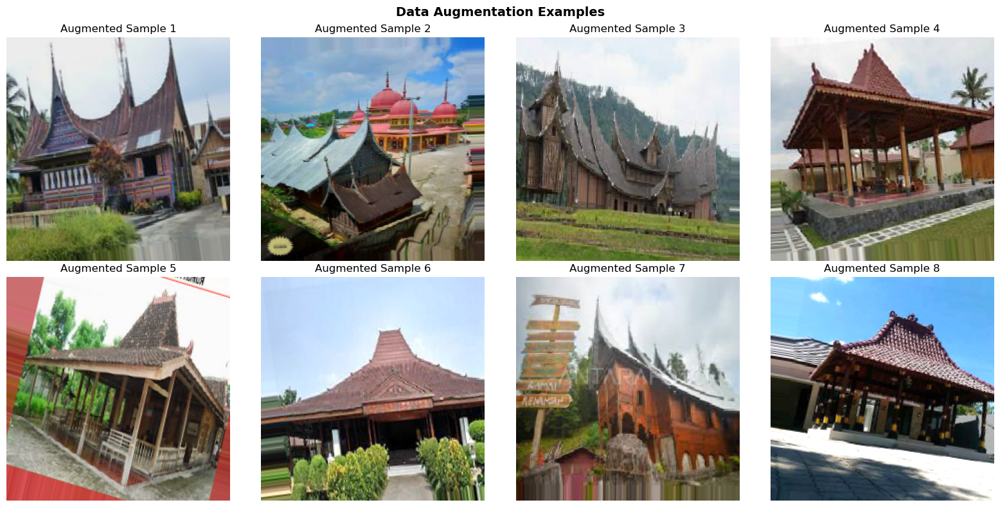

In [71]:
# ============================================
# VISUALIZE AUGMENTED IMAGES
# ============================================

print("\n" + "="*70)
print("VISUALIZING DATA AUGMENTATION")
print("="*70)

visualize_augmentation(train_generator, n_images=8)

In [72]:
# ============================================
# BUILD MODEL - TRANSFER LEARNING
# ============================================

print("\n" + "="*70)
print("BUILDING MODEL")
print("="*70)

# Load pre-trained model
print("Loading MobileNetV2 (pre-trained on ImageNet)...")
base_model = MobileNetV2(
    input_shape=(*IMG_SIZE, 3),
    include_top=False,
    weights='imagenet'
)

# Freeze base model
base_model.trainable = False
print(f"✓ Base model loaded ({len(base_model.layers)} layers)")
print(f"✓ Base model frozen (trainable={base_model.trainable})")

# Add custom classifier head
x = base_model.output
x = GlobalAveragePooling2D(name='global_avg_pool')(x)
x = Dense(128, activation='relu', name='dense_1')(x)
x = Dropout(0.3, name='dropout')(x)
predictions = Dense(len(CLASS_NAMES), activation='softmax', name='predictions')(x)

# Create final model
model = Model(inputs=base_model.input, outputs=predictions)

print(f"\n✓ Model architecture:")
print(f"  Input shape: {model.input_shape}")
print(f"  Output classes: {len(CLASS_NAMES)}")
print(f"  Total parameters: {model.count_params():,}")

# Count trainable vs non-trainable
trainable_count = sum([tf.size(w).numpy() for w in model.trainable_weights])
non_trainable_count = sum([tf.size(w).numpy() for w in model.non_trainable_weights])

print(f"  Trainable parameters: {trainable_count:,}")
print(f"  Non-trainable parameters: {non_trainable_count:,}")

print("="*70)


BUILDING MODEL
Loading MobileNetV2 (pre-trained on ImageNet)...
✓ Base model loaded (154 layers)
✓ Base model frozen (trainable=False)

✓ Model architecture:
  Input shape: (None, 224, 224, 3)
  Output classes: 2
  Total parameters: 2,422,210
  Trainable parameters: 164,226
  Non-trainable parameters: 2,257,984


In [73]:
# ============================================
# COMPILE MODEL
# ============================================

print("\n" + "="*70)
print("COMPILING MODEL")
print("="*70)

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(f"✓ Optimizer: Adam (lr={LEARNING_RATE})")
print(f"✓ Loss: categorical_crossentropy")
print(f"✓ Metrics: accuracy")
print("="*70)

# Print model summary
print("\nModel Summary:")
model.summary()


COMPILING MODEL
✓ Optimizer: Adam (lr=0.001)
✓ Loss: categorical_crossentropy
✓ Metrics: accuracy

Model Summary:


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer_9[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 2,422,210 (9.24 MB)

 Trainable params: 164,226 (641.51 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [74]:
# ============================================
# SETUP CALLBACKS
# ============================================

print("\n" + "="*70)
print("SETTING UP CALLBACKS")
print("="*70)

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)
print("✓ Early Stopping: patience=5, monitor=val_loss")

# Model checkpoint
checkpoint_path = os.path.join(MODEL_SAVE_PATH, 'best_model.keras')
model_checkpoint = ModelCheckpoint(
    checkpoint_path,
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)
print(f"✓ Model Checkpoint: {checkpoint_path}")

# Reduce learning rate on plateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-7,
    verbose=1
)
print("✓ Reduce LR on Plateau: factor=0.5, patience=3")

callbacks = [early_stopping, model_checkpoint, reduce_lr]

print("="*70)


SETTING UP CALLBACKS
✓ Early Stopping: patience=5, monitor=val_loss
✓ Model Checkpoint: models\best_model.keras
✓ Reduce LR on Plateau: factor=0.5, patience=3


In [75]:
# ============================================
# TRAINING PHASE 1: FEATURE EXTRACTION
# ============================================

print("\n" + "="*70)
print("STARTING TRAINING - PHASE 1: FEATURE EXTRACTION")
print("Base model: FROZEN")
print("Training: Custom classifier head only")
print("="*70)

history_phase1 = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    class_weight=CLASS_WEIGHTS,
    callbacks=callbacks,
    verbose=1
)

print("\n" + "="*70)
print("✓ PHASE 1 TRAINING COMPLETE")
print("="*70)


STARTING TRAINING - PHASE 1: FEATURE EXTRACTION
Base model: FROZEN
Training: Custom classifier head only


C:\Users\ASUS\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 719ms/step - accuracy: 0.7890 - loss: 0.4045
Epoch 1: val_accuracy improved from None to 0.97738, saving model to models\best_model.keras
33/33 ━━━━━━━━━━━━━━━━━━━━ 31s 871ms/step - accuracy: 0.8808 - loss: 0.2562 - val_accuracy: 0.9774 - val_loss: 0.0583 - learning_rate: 0.0010
Epoch 2/20
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 715ms/step - accuracy: 0.9723 - loss: 0.0770
Epoch 2: val_accuracy improved from 0.97738 to 0.98643, saving model to models\best_model.keras
33/33 ━━━━━━━━━━━━━━━━━━━━ 27s 828ms/step - accuracy: 0.9709 - loss: 0.0813 - val_accuracy: 0.9864 - val_loss: 0.0394 - learning_rate: 0.0010
Epoch 3/20
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 685ms/step - accuracy: 0.9788 - loss: 0.0699
Epoch 3: val_accuracy did not improve from 0.98643
33/33 ━━━━━━━━━━━━━━━━━━━━ 26s 792ms/step - accuracy: 0.9729 - loss: 0.0766 - val_accuracy: 0.9864 - val_loss: 0.0322 - learning_rate: 0.0010
Epoch 4/20
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 677ms/step - accuracy: 0.9721 - los

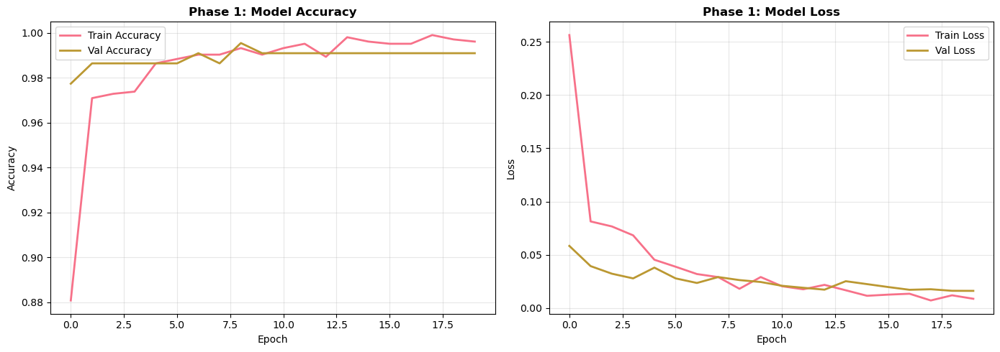


Best Epoch: 9
  Train Accuracy: 0.9932
  Val Accuracy: 0.9955
  Train Loss: 0.0181
  Val Loss: 0.0263


In [76]:
# ============================================
# VISUALIZE TRAINING HISTORY - PHASE 1
# ============================================

def plot_training_history(history, phase_name="Phase 1"):
    """Plot training and validation accuracy/loss"""
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    
    # Accuracy plot
    ax1.plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2)
    ax1.set_title(f'{phase_name}: Model Accuracy', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Loss plot
    ax2.plot(history.history['loss'], label='Train Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Val Loss', linewidth=2)
    ax2.set_title(f'{phase_name}: Model Loss', fontsize=12, fontweight='bold')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_PATH, f'training_history_{phase_name.lower().replace(" ", "_")}.png'), 
                dpi=150, bbox_inches='tight')
    plt.show()
    
    # Print best results
    best_epoch = np.argmax(history.history['val_accuracy'])
    print(f"\nBest Epoch: {best_epoch + 1}")
    print(f"  Train Accuracy: {history.history['accuracy'][best_epoch]:.4f}")
    print(f"  Val Accuracy: {history.history['val_accuracy'][best_epoch]:.4f}")
    print(f"  Train Loss: {history.history['loss'][best_epoch]:.4f}")
    print(f"  Val Loss: {history.history['val_loss'][best_epoch]:.4f}")

plot_training_history(history_phase1, "Phase 1")

In [77]:
# ============================================
# EVALUATE ON TEST SET
# ============================================

print("\n" + "="*70)
print("EVALUATING ON TEST SET")
print("="*70)

# Load best model
model = keras.models.load_model(checkpoint_path)
print(f"✓ Loaded best model from: {checkpoint_path}")

# Evaluate
test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)

print(f"\n{'='*70}")
print(f"TEST RESULTS:")
print(f"{'='*70}")
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")
print(f"{'='*70}")


EVALUATING ON TEST SET
✓ Loaded best model from: models\best_model.keras
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 733ms/step - accuracy: 0.9775 - loss: 0.0648

TEST RESULTS:
Test Loss: 0.0648
Test Accuracy: 0.9775 (97.75%)



GENERATING PREDICTIONS
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 640ms/step

CLASSIFICATION REPORT
              precision    recall  f1-score   support

      gadang       0.98      0.99      0.99       111
       joglo       0.99      0.98      0.99       111

    accuracy                           0.99       222
   macro avg       0.99      0.99      0.99       222
weighted avg       0.99      0.99      0.99       222



<Figure size 1000x800 with 0 Axes>

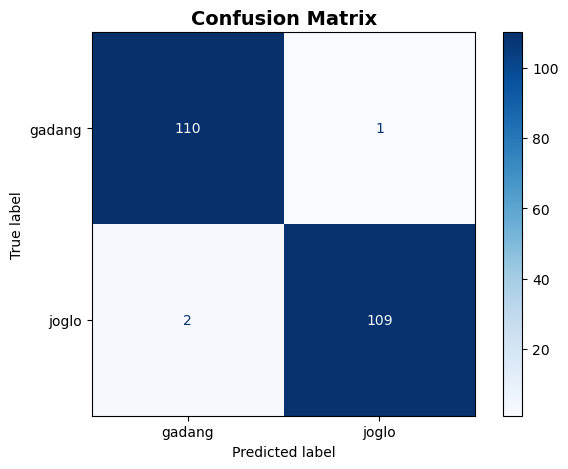


PER-CLASS ACCURACY
gadang: 110/111 = 0.9910 (99.10%)
joglo: 109/111 = 0.9820 (98.20%)


In [23]:
# ============================================
# GENERATE PREDICTIONS & CONFUSION MATRIX
# ============================================

print("\n" + "="*70)
print("GENERATING PREDICTIONS")
print("="*70)

# Get predictions
test_generator.reset()
y_pred = model.predict(val_generator, verbose=1)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

# Classification report
print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)
print(classification_report(y_true, y_pred_classes, target_names=CLASS_NAMES))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_PATH, 'confusion_matrix.png'), 
            dpi=150, bbox_inches='tight')
plt.show()

# Per-class accuracy
print("\n" + "="*70)
print("PER-CLASS ACCURACY")
print("="*70)
for idx, class_name in enumerate(CLASS_NAMES):
    class_correct = cm[idx, idx]
    class_total = cm[idx, :].sum()
    class_acc = class_correct / class_total if class_total > 0 else 0
    print(f"{class_name}: {class_correct}/{class_total} = {class_acc:.4f} ({class_acc*100:.2f}%)")
print("="*70)

In [99]:
# ============================================
# VISUALIZE PREDICTIONS
# ============================================

def visualize_predictions(generator, model, class_names, n_correct=4, n_incorrect=4):
    """Visualize correct and incorrect predictions"""
    
    generator.reset()
    predictions = model.predict(generator, verbose=0)
    pred_classes = np.argmax(predictions, axis=1)
    true_classes = generator.classes
    
    # Find correct and incorrect predictions
    correct_idx = np.where(pred_classes == true_classes)[0]
    incorrect_idx = np.where(pred_classes != true_classes)[0]
    
    # Sample
    correct_samples = np.random.choice(correct_idx, min(n_correct, len(correct_idx)), replace=False)
    incorrect_samples = np.random.choice(incorrect_idx, min(n_incorrect, len(incorrect_idx)), replace=False)
    
    # Get file paths
    filepaths = generator.filepaths
    
    # Plot correct predictions
    if len(correct_samples) > 0:
        fig, axes = plt.subplots(1, len(correct_samples), figsize=(4*len(correct_samples), 4))
        if len(correct_samples) == 1:
            axes = [axes]
        
        fig.suptitle('✓ Correct Predictions', fontsize=14, fontweight='bold', color='green')
        
        for idx, sample_idx in enumerate(correct_samples):
            img = load_img(filepaths[sample_idx], target_size=IMG_SIZE)
            axes[idx].imshow(img)
            axes[idx].axis('off')
            
            true_label = class_names[true_classes[sample_idx]]
            confidence = predictions[sample_idx][pred_classes[sample_idx]]
            axes[idx].set_title(f'True: {true_label}\nConf: {confidence:.2%}', 
                              fontsize=10)
        
        plt.tight_layout()
        plt.savefig(os.path.join(RESULTS_PATH, 'correct_predictions.png'), 
                    dpi=150, bbox_inches='tight')
        plt.show()
    # Plot incorrect predictions
    if len(incorrect_samples) > 0:
        fig, axes = plt.subplots(1, len(incorrect_samples), figsize=(4*len(incorrect_samples), 4))
        if len(incorrect_samples) == 1:
            axes = [axes]
        
        fig.suptitle('✗ Incorrect Predictions', fontsize=14, fontweight='bold', color='red')
        
        for idx, sample_idx in enumerate(incorrect_samples):
            img = load_img(filepaths[sample_idx], target_size=IMG_SIZE)
            axes[idx].imshow(img)
            axes[idx].axis('off')
            
            true_label = class_names[true_classes[sample_idx]]
            pred_label = class_names[pred_classes[sample_idx]]
            confidence = predictions[sample_idx][pred_classes[sample_idx]]
            
            axes[idx].set_title(f'True: {true_label}\nPred: {pred_label}\nConf: {confidence:.2%}', 
                              fontsize=10, color='red')
        
        plt.tight_layout()
        plt.savefig(os.path.join(RESULTS_PATH, 'incorrect_predictions.png'), 
                    dpi=150, bbox_inches='tight')
        plt.show()

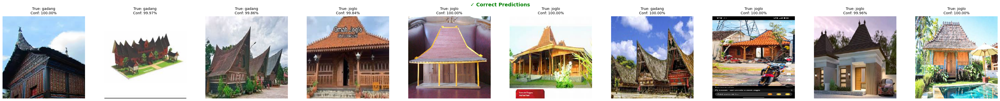

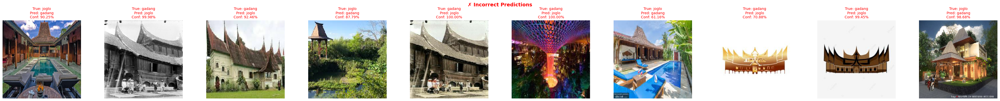

In [100]:
visualize_predictions(test_generator, model_baseline, CLASS_NAMES, n_correct=10, n_incorrect=10)

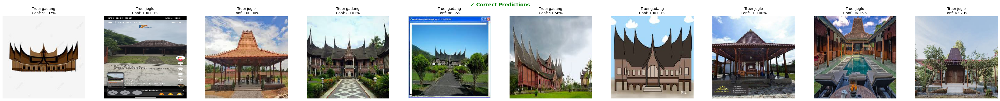

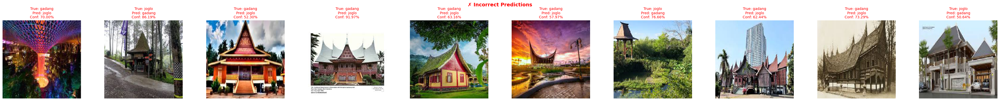

In [101]:
visualize_predictions(test_generator, model_aug, CLASS_NAMES, n_correct=10, n_incorrect=10)

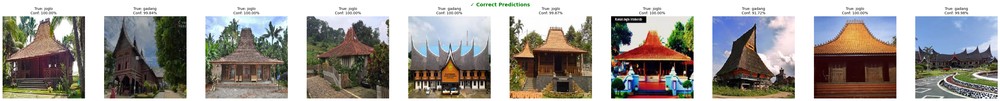

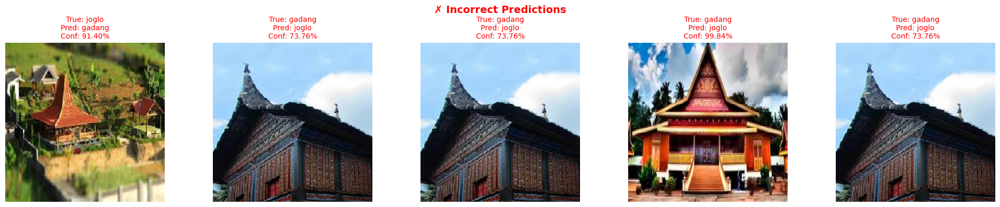

In [102]:
visualize_predictions(test_generator, model, CLASS_NAMES, n_correct=10, n_incorrect=10)

In [97]:
# ============================================
# SAVE FINAL MODEL & SUMMARY
# ============================================

print("\n" + "="*70)
print("SAVING FINAL MODEL")
print("="*70)

# Save model
final_model_path = os.path.join(MODEL_SAVE_PATH, 'final_model1.keras')
model.save(final_model_path)
print(f"✓ Model saved to: {final_model_path}")

# Save training history
history_path = os.path.join(RESULTS_PATH, 'training_history.npy')
np.save(history_path, history_phase1.history)
print(f"✓ Training history saved to: {history_path}")

# Create summary report
summary_path = os.path.join(RESULTS_PATH, 'training_summary.txt')
with open(summary_path, 'w') as f:
    f.write("="*70 + "\n")
    f.write("TRAINING SUMMARY: Rumah Gadang vs Joglo Classification\n")
    f.write("="*70 + "\n\n")
    
    f.write("DATASET:\n")
    f.write(f"  Total images: {train_generator.samples + val_generator.samples + test_generator.samples}\n")
    f.write(f"  Train: {train_generator.samples}\n")
    f.write(f"  Validation: {val_generator.samples}\n")
    f.write(f"  Test: {test_generator.samples}\n")
    f.write(f"  Classes: {CLASS_NAMES}\n\n")
    
    f.write("MODEL:\n")
    f.write(f"  Architecture: MobileNetV2 + Custom Head\n")
    f.write(f"  Input size: {IMG_SIZE}\n")
    f.write(f"  Total parameters: {model.count_params():,}\n\n")
    
    f.write("TRAINING:\n")
    f.write(f"  Epochs: {len(history_phase1.history['accuracy'])}\n")
    f.write(f"  Batch size: {BATCH_SIZE}\n")
    f.write(f"  Learning rate: {LEARNING_RATE}\n")
    f.write(f"  Class weights: {CLASS_WEIGHTS}\n\n")
    
    f.write("RESULTS:\n")
    f.write(f"  Test Accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)\n")
    f.write(f"  Test Loss: {test_loss:.4f}\n\n")
    
    f.write("FILES:\n")
    f.write(f"  Best model: {checkpoint_path}\n")
    f.write(f"  Final model: {final_model_path}\n")
    f.write(f"  Results: {RESULTS_PATH}/\n")

print(f"✓ Summary saved to: {summary_path}")

print("\n" + "="*70)
print("✓ ALL DONE!")
print("="*70)
print(f"\nYour files are saved in:")
print(f"  Models: {MODEL_SAVE_PATH}/")
print(f"  Results: {RESULTS_PATH}/")


SAVING FINAL MODEL
✓ Model saved to: models\final_model1.keras
✓ Training history saved to: results\training_history.npy
✓ Summary saved to: results\training_summary.txt

✓ ALL DONE!

Your files are saved in:
  Models: models/
  Results: results/
